# Install Libraries

In [1]:
!pip install pytube youtube-transcript-api opencv-python

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 kB 2.2 MB/s eta 0:00:00



# Import Dependencies

In [2]:
from pytube import YouTube
from youtube_transcript_api import YouTubeTranscriptApi
from google.colab import drive
import os
import re
import cv2
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub

In [3]:
if tf.test.gpu_device_name():
    print("GPU is available")
else:
    print("GPU is NOT available")

GPU is available


# Video Search




## Step 1:  Video library (10 points)

Write a python API  that will download the video and its closed captions from youtube. Make sure to document how one can use your API. Use this to download the following videos from youtube along with thei captions:

https://www.youtube.com/watch?v=wbWRWeVe1XE

https://www.youtube.com/watch?v=FlJoBhLnqko

https://www.youtube.com/watch?v=Y-bVwPRy_no

# YouTube API

To download the video and captions of a specified list of videos, instantiate the YouTubeDownloader class with a list of video_ids (the string that comes after 'https://www.youtube.com/watch?v=' in the YouTube URL). Call the download_all attribute with the output path as an argument to download both the video and captions, or call the download_video and download_captions attributes with the video_id list and output path as arguments to download videos or captions separately

In [4]:
class YouTubeDownloader:
    """
    A class for downloading YouTube videos and their captions.

    Parameters:
    - video_ids (list): A list of YouTube video IDs to be downloaded.

    Methods:
    - download_video(video_id, output_path="."): Downloads a YouTube video by its ID.
    - download_captions(video_id, output_path="."): Downloads captions for a YouTube video by its ID.
    - download_all(output_path="."): Downloads videos and captions for all specified video IDs.

    Note:
    - The download paths for videos and captions are set within the 'videos' and 'captions' subdirectories.
    """

    def __init__(self, video_ids):
        self.video_ids = video_ids

    def download_video(self, video_id, output_path="."):
        try:
            yt = YouTube(f"https://www.youtube.com/watch?v={video_id}")
            video = yt.streams.filter(file_extension='mp4', resolution='360p').first()
            video_output = os.path.join(output_path, "videos")
            video.download(video_output)
            print(f"Video downloaded successfully: {yt.title}")
        except Exception as e:
            print(f"Error downloading video: {e}")

    def download_captions(self, video_id, output_path="."):
        try:
            transcript = YouTubeTranscriptApi.get_transcript(video_id)
            # clean up captions filename
            video_title = YouTube(f'https://www.youtube.com/watch?v={video_id}').title
            cleaned_filename = video_title.replace("'", "")
            cleaned_filename = re.sub(r'\s+', ' ', cleaned_filename)
            captions_filename = f"{cleaned_filename}_captions.txt"
            captions_path = os.path.join(output_path, "captions", captions_filename)

            with open(captions_path, "w", encoding="utf-8") as file:
                file.write(f"Video Title: {YouTube(f'https://www.youtube.com/watch?v={video_id}').title}\n")
                file.write(f"Video URL: https://www.youtube.com/watch?v={video_id}\n\n")
                for entry in transcript:
                    file.write(f"{entry['start']} - {entry['start'] + entry['duration']}\n")
                    file.write(f"{entry['text']}\n\n")
            print(f"Captions downloaded successfully: {YouTube(f'https://www.youtube.com/watch?v={video_id}').title}")
        except Exception as e:
            print(f"Error downloading captions: {e}")

    def download_all(self, output_path="."):
        for video_id in self.video_ids:
            self.download_video(video_id, output_path)
            self.download_captions(video_id, output_path)


In [5]:
# save files to Google Drive
drive.mount('./YouTubeDownloads')

video_ids = ["wbWRWeVe1XE", "FlJoBhLnqko", "Y-bVwPRy_no"]
output_path = "/content/drive/MyDrive/ColabNotebooks/YouTubeDownloads"

video_output_path = os.path.join(output_path, "videos")
caption_output_path = os.path.join(output_path, "captions")

os.makedirs(output_path, exist_ok=True)
os.makedirs(video_output_path, exist_ok=True)
os.makedirs(caption_output_path, exist_ok=True)

downloader = YouTubeDownloader(video_ids)
downloader.download_all(output_path)

Mounted at ./YouTubeDownloads
Video downloaded successfully: What Does 'High-Quality' Preschool Look Like? | NPR Ed
Captions downloaded successfully: What Does 'High-Quality' Preschool Look Like? | NPR Ed
Video downloaded successfully: How Green Roofs Can Help Cities | NPR
Captions downloaded successfully: How Green Roofs Can Help Cities | NPR
Video downloaded successfully: Why It’s Usually Hotter In A City | Let's Talk | NPR
Captions downloaded successfully: Why It’s Usually Hotter In A City | Let's Talk | NPR


In [6]:
print("Parent Directory:")
!ls $output_path
print("\nVideo Directory:")
!ls $video_output_path
print("\nCaptions Directory:")
!ls $caption_output_path

# rmdir
#import shutil
#shutil.rmtree(output_path)


Parent Directory:
captions  videos

Video Directory:
'How Green Roofs Can Help Cities  NPR.mp4'
'What Does High-Quality Preschool Look Like  NPR Ed.mp4'
'Why It’s Usually Hotter In A City  Lets Talk  NPR.mp4'

Captions Directory:
'How Green Roofs Can Help Cities | NPR_captions.txt'
'What Does High-Quality Preschool Look Like? | NPR Ed_captions.txt'
'Why It’s Usually Hotter In A City | Lets Talk | NPR_captions.txt'


## Step 2: Video indexing pipeline (90 points)

In this step you will build and train your models to extract embeddings for the frames of your videos and store the extracted information in a database such as postgres for indexing the videos.

### 2.1 Preprocess the video (15 points)

You can use opencv, ffmpeg, gstreameer, https://pytorchvideo.org/ or any other library to implement the preprocessing steps as shown below:
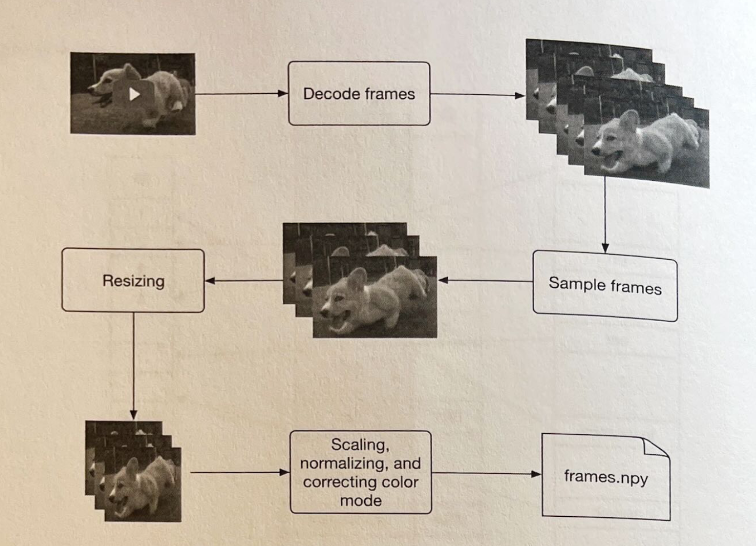



In [75]:
def preprocess_video_from_file(video_path, sample_rate, target_size, timestamps):
    """
    Preprocesses frames from a video file.

    Parameters:
    - video_path (str): Path to the video file.
    - sample_rate (int): Frame sampling rate, indicating the frequency of frame sampling (e.g., sample every N frames).
    - target_size (tuple): Target size for resizing frames, specified as (height, width).
    - timestamps (list): A list to store timestamps corresponding to each sampled frame.

    Returns:
    - numpy.ndarray: Array of preprocessed frames with shape (num_frames, height, width, channels).
      Each frame is resized, converted to RGB, and appended with its corresponding timestamp.

    Note:
    - The frames are resized to the specified target size.
    - Timestamps are saved in a separate array for each sampled frame.
    - Frames are not normalized because I found better performance without normalization, although I did attempt to normalize with mean/std then convert back to 0 <= uint8 >=255
    """

    # Create a VideoCapture object
    cap = cv2.VideoCapture(video_path)

    # Check if the video opened successfully
    if not cap.isOpened():
        print("Error: Could not open video.")
        return None

    # Lists to store preprocessed frames
    frames = []

    # Iterate through the frames
    while True:
        # Read a frame from the video
        ret, frame = cap.read()

        # Check if the video has ended
        if not ret:
            break

        # Sample frames
        if cap.get(1) % sample_rate == 0:
            # Resize the frame
            frame = cv2.resize(frame, target_size)

            # Convert BGR to RGB
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

            # save timestamps to separate array
            timestamps.append(cap.get(cv2.CAP_PROP_POS_MSEC))

            # Append the preprocessed frame to the list
            frames.append(frame)

    # Release the VideoCapture object
    cap.release()

    # Returnlist of frames converted to a NumPy array
    return np.array(frames)

In [77]:
# save all mp4 paths to video_paths list
video_paths = []
for root, dirs, files in os.walk(video_output_path):
  for file in files:
    full_path = os.path.join(root, file)
    video_paths.append(full_path)

# Parameters for frame sampling and preprocessing, standard ImageNet values for natural images: https://stackoverflow.com/questions/58151507/why-pytorch-officially-use-mean-0-485-0-456-0-406-and-std-0-229-0-224-0-2
sample_rate = 10  # Sample every 10 frames
target_size = (640, 360)  # Target width for resizing taken from pretrained model parameters, height maintains aspect ratio: https://www.kaggle.com/models/tensorflow/faster-rcnn-inception-resnet-v2/frameworks/TensorFlow2/variations/640x640/versions/1
timestamps = []

frames_array = preprocess_video_from_file(video_paths[0], sample_rate, target_size, timestamps)
print(frames_array.shape)

(549, 360, 640, 3)


### 2.2 Detecting objects (25 points)

Use any of the pretrained object-detectors to detect objects belonging to MS COCO classes.
For each video, for each frame where a detection is found, compile and report the results in the following tabular structure :

[vidId, frameNum, timestamp, detectedObjId, detectedObjClass, confidence, bbox info]

Feel free to finetune your detectors if required. If you notice that your model performs better on a different video from this [channel](https://www.youtube.com/@NPR), document this and you can use this video for the rest of this assignment.

### 2.3 Embedding model (30 points)

Develop a convolutional autoencoder such as [the one described here](https://blog.keras.io/building-autoencoders-in-keras.html) whose input will be all the objects detected in each frame (not the entire frame!), if any.
Note : You can downsample the frame rate of your original video to avoid long training/processing times. For a given input image, the autoencoder should output it's small vector embedding.

Train your autoencoder on the COCO dataset for classes which get detected in the given list of videos.

#### Extra credit (10 points)
Extra credit: if you want to maximize the possibility of developing something **new** think about how a video can be better segmented into representative frames. For example, [in this ~3min video accessed Nov 2023](https://youtu.be/FN8a8mZNik8?si=wXdbOGuLGkGsWsf) you have multiple scenes each one lasting 30sec or so. Can you find a way to segment each video and store the frame embeddings of each segment? This way there are multiple embeddings per video and you need to keep them that way for the subsequesnt steps of this project.

### Indexing the embeddings (20 points)

Use `docker compose` to bring up two docker containers, your application container with the dev environment (you must have done this in Step 1) and a second container with postgres.

`docker pull postgres:latest`

Process all the detected object sub-images for each frame of each video to compile your final results in the following tabular structure:
[vidId, frameNum, timestamp, detectedObjId, detectedObjClass, confidence, bbox info, vector<embedding of this object>, optional<sceneId from extra credit>]

Index the video images embedding vectors in the database. To do that in postgres (with the pgvector extension) you can use [this guide](https://dev.to/sfoteini/image-vector-similarity-search-with-azure-computer-vision-and-postgresql-12f7).

Demonstrate that you can search the database using image queries and post the screenshots of your search results that must include the first 10 similar images across the input videos.


# Solution Problem 2.2

In [14]:
# Load the COCO pre-trained model from TensorFlow Hub
model_url = "https://www.kaggle.com/models/tensorflow/faster-rcnn-inception-resnet-v2/frameworks/TensorFlow2/variations/640x640/versions/1"
detector = hub.load(model_url)

In [78]:
# Set the threshold
threshold = 0.90
frame_nums = []
detected_obj_ids = []
confidence_scores = []
bbox_info = []

for i, frame in enumerate(frames_array):
  image_tensor = tf.expand_dims(frame, axis=0)
  detector_output = detector(image_tensor)

  # Convert the tensor to a NumPy array
  scores_tensor = detector_output["detection_scores"][0]
  scores_array = scores_tensor.numpy()

  # Find indices where the scores are greater than the threshold
  indices_above_threshold = np.where(scores_array > threshold)[0]

  # Print scores and corresponding classes
  for index in indices_above_threshold:
    frame_nums.append(i)
    detected_obj_ids.append(detector_output["detection_classes"][0][index].numpy())
    confidence_scores.append(scores_array[index])
    bbox_info.append(detector_output["detection_boxes"][0][index].numpy())

In [79]:
print(len(frame_nums))
print()
'''
for i, frame in enumerate(frame_nums):
  print("Frame: ", frame)
  print("Object ID: ", detected_obj_ids[i])
  print("Confidence: ", confidence_scores[i])
  print("BBox: ", bbox_info[i])
  print("Timestamp: ", timestamps[frame])
  print()
'''

189



'\nfor i, frame in enumerate(frame_nums):\n  print("Frame: ", frame)\n  print("Object ID: ", detected_obj_ids[i])\n  print("Confidence: ", confidence_scores[i])\n  print("BBox: ", bbox_info[i])\n  print("Timestamp: ", timestamps[frame])\n  print()\n'

In [82]:
def display_frame_with_bbox(video_path, frame_number, object_id, confidence, bbox, timestamp):
    # import google patch for cv2.imshow
    from google.colab.patches import cv2_imshow
    # Create a VideoCapture object
    cap = cv2.VideoCapture(video_path)

    # Check if the video opened successfully
    if not cap.isOpened():
        print("Error: Could not open video.")
        return

    # Set the frame number for the preprocessed video
    frame_to_display = frame_number * 10

    # Set the VideoCapture object to the desired frame
    cap.set(cv2.CAP_PROP_POS_FRAMES, frame_to_display)

    # Read the frame
    ret, frame = cap.read()

    # Check if the frame is read successfully
    if not ret:
        print("Error: Could not read frame.")
        return

    # Get the original width and height of the frame
    original_height, original_width = frame.shape[:2]

    # Draw bounding box on the original-sized frame
    y_min, x_min, y_max, x_max = bbox
    x_min_scaled, y_min_scaled, x_max_scaled, y_max_scaled = (
        int(x_min * original_width),
        int(y_min * original_height),
        int(x_max * original_width),
        int(y_max * original_height),
    )
    cv2.rectangle(frame, (x_min_scaled, y_min_scaled), (x_max_scaled, y_max_scaled), (0, 255, 0), 2)  # Green rectangle

    # Display bounding box information on the frame
    text = f"Object ID: {object_id}, Confidence: {confidence}"
    cv2.putText(frame, text, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 0, 255), 2)  # Red text

    # Display the frame, colab does not get along with cv2.imshow(), so imported patch from google.colab.patches
    cv2_imshow(frame)

    # Release the VideoCapture object
    cap.release()

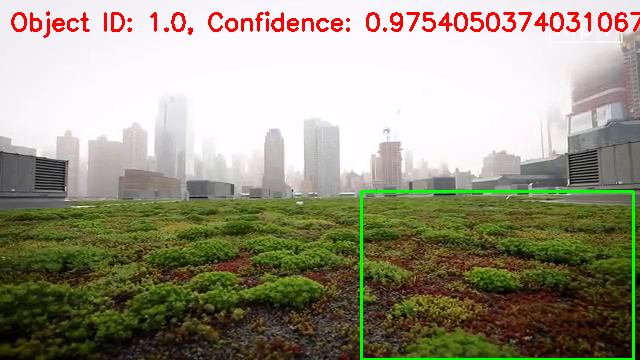

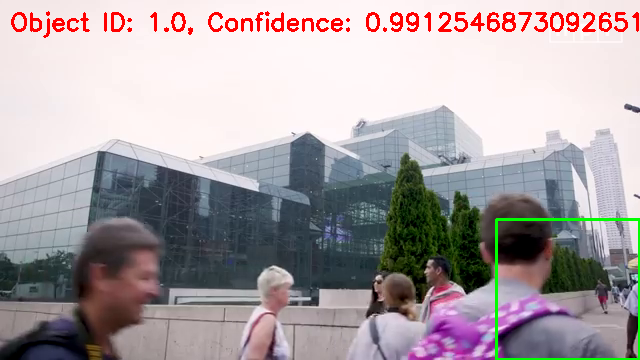

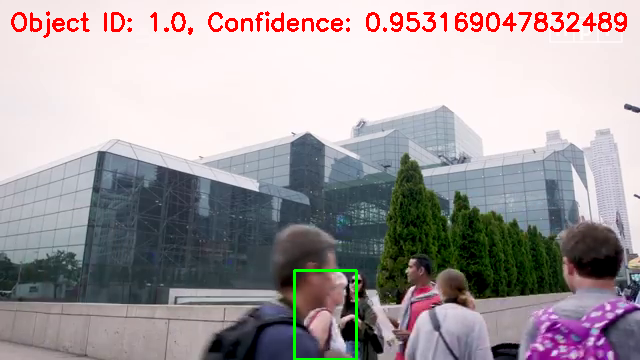

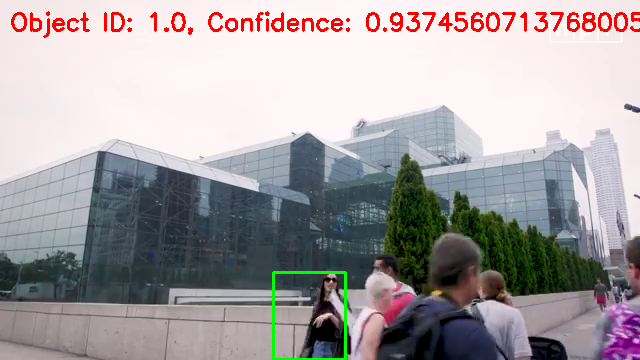

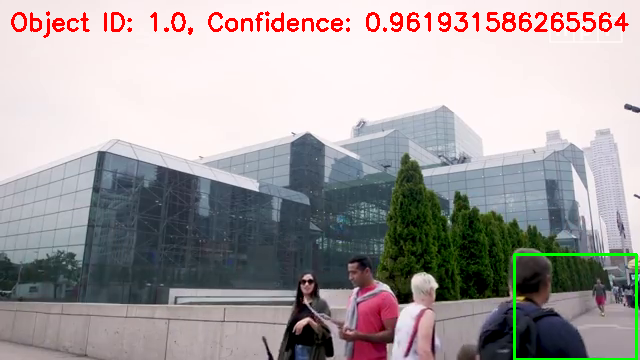

...

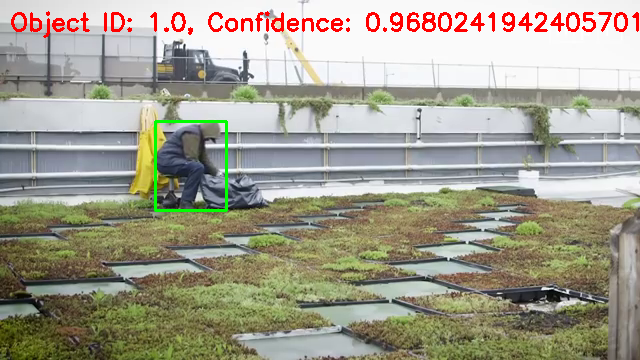

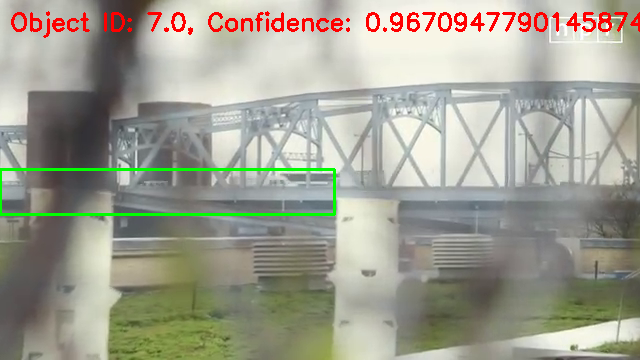

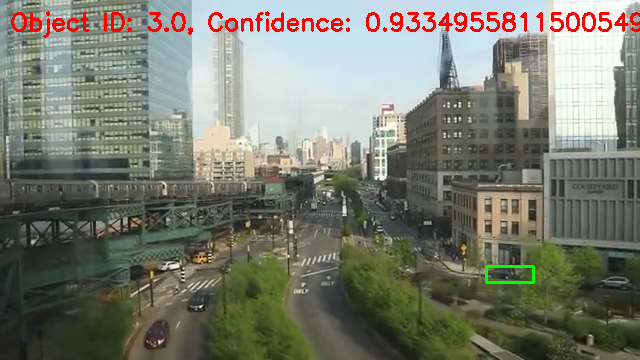

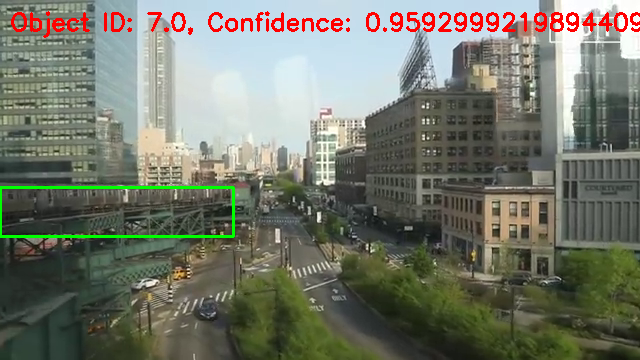

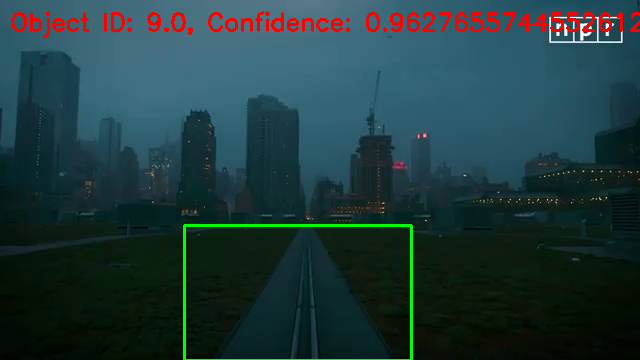

In [83]:
# display sample images with bounding boxes
for i in range(0, len(frame_nums), 5):
  frame_number = frame_nums[i]
  object_id = detected_obj_ids[i]
  conf = confidence_scores[i]
  bbox = bbox_info[i]
  timestamp = timestamps[i]

  display_frame_with_bbox(video_paths[0], frame_number, object_id, conf, bbox, timestamp)